# Script description
### Input
* MongoDB database provided by Michiel Aernouts. This database contains metadata of the Belair sensors installed on bpost vans using the LoRa network. 
* This database contains the following elements:
    * _id: this is a unique ID generated for this packet 
    * device: unique ID for the device that sent the packet 
    * gateways: a list of the gateways that picked up the packet with their respective parameters (max 3) 
    * gpsLat and gpsLon: location 
    * hdop: measure for the correctness of the location 
    * rx_time: time of reception of the packet 
    * seqNumber: sequence number for the packets 
    * spfact: Spreading factor

### Output
* In this Notebook

In [45]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

# Preparation

## Create a Mongo Client and load data

In [46]:
import os
import pandas as pd
import numpy as np
from IPython.core.display import display, HTML
import pymongo
from pymongo import MongoClient
import folium
import json
from shapely.geometry import Point
from shapely.geometry.polygon import Polygon
import geopandas as gpd
from matplotlib import pyplot as plt
import time
from datetime import datetime
from datetime import timedelta  
from selenium import webdriver
from scipy import special, optimize
from IPython.display import Math
import math
from matplotlib.pyplot import figure
from bokeh.plotting import figure, output_notebook, show
import glob

In [47]:
print("Pymongo version: " + pymongo.__version__)
client = MongoClient('localhost', 27017)
db = client.Belair
collection = db.data

# Extract data, sort by timestamp and reset indexes
df = pd.DataFrame(list(collection.find())).reset_index(drop=True)
print(len(df))
df.head()

Pymongo version: 3.7.2
193008


,_id,device,gateways,gpsLat,gpsLon,hdop,rx_time,seqNumber,spfact
0,5c17af0d4fa20f164de4b0bb,3432333852378918,"[{'rssi': -93, 'esp': -93.461838, 'snr': 10, '...",51.194618,4.418419,0.66,2018-12-17 14:13:33.410,54916,7
1,5c17af2d4fa20f164de4b0c7,3432333852378918,"[{'rssi': -104, 'esp': -104.331955, 'snr': 11,...",51.194618,4.418417,0.69,2018-12-17 14:14:04.616,54917,7
2,5c17af3c4fa20f164de4b0cb,3432333855378A18,"[{'rssi': -107, 'esp': -111.124428, 'snr': -2,...",51.215408,4.413910,0.67,2018-12-17 14:14:19.768,15653,7
3,5c17af4d4fa20f164de4b0d4,3432333852378918,"[{'rssi': -107, 'esp': -107.973228, 'snr': 6, ...",51.194614,4.418419,0.74,2018-12-17 14:14:36.499,54918,7
4,5c17af604fa20f164de4b0df,3432333851378918,"[{'rssi': -114, 'esp': -119.455406, 'snr': -4,...",51.241817,4.430120,0.66,2018-12-17 14:14:56.056,48522,7


## Extend dataframe with other features

In [48]:
def extend_df(df):
    # Sort
    #df2 = df.sort_values(['device','rx_time'],ascending=[False,True]).reset_index()    
    df2 = df.sort_values(['device'],ascending=[False]).reset_index()
    df2 = df2.sort_values(['rx_time'],ascending=[True]).reset_index()
    
    # Add day-of-the-week columns
    df2['day_of_week'] = df2['rx_time'].dt.day_name()
    
    # Add separate time and date columns
    df2['time'] = df2['rx_time'].dt.time
    df2['date'] = df2['rx_time'].dt.date
    df2['date'] = pd.to_datetime(df2['date'])
    
    # Calculate time differences based on the device IDs 
    diff = df2.groupby('device')['rx_time'].diff()
    
    # Check if the SPF changed
    same_spfact = df2.groupby('device')['spfact'].apply(lambda x : x==x.shift())
    
    # Check how much the SPF changed
    spfact_diff = df2.groupby('device')['spfact'].apply(lambda x : x-x.shift())
    
    # Add column with SPF of previous packet
    prev_spfact = df2['spfact'].shift()
    
    # Add the new columns to the previous data frame
    df2 = df2.assign(diff=pd.Series(diff.values))
    df2['diff'] = df2['diff'].astype('timedelta64[s]')
    df2 = df2.assign(same_spfact=pd.Series(same_spfact.values))
    df2 = df2.assign(spfact_diff=pd.Series(spfact_diff.values))
    df2 = df2.assign(prev_spfact=pd.Series(prev_spfact.values))
    # Drop the rows with NaT-value
    df2 = df2.dropna(subset=['diff'])
    
    return df2

In [49]:
df2 = extend_df(df).drop(columns=['level_0', 'index'])
df2.head()

,_id,device,gateways,gpsLat,gpsLon,hdop,rx_time,seqNumber,spfact,day_of_week,time,date,diff,same_spfact,spfact_diff,prev_spfact
2,5c17af2d4fa20f164de4b0c7,3432333852378918,"[{'rssi': -104, 'esp': -104.331955, 'snr': 11,...",51.194618,4.418417,0.69,2018-12-17 14:14:04.616,54917,7,Monday,14:14:04.616000,2018-12-17,31.0,True,0.0,7.0
3,5c17af3c4fa20f164de4b0cb,3432333855378A18,"[{'rssi': -107, 'esp': -111.124428, 'snr': -2,...",51.215408,4.413910,0.67,2018-12-17 14:14:19.768,15653,7,Monday,14:14:19.768000,2018-12-17,31.0,True,0.0,7.0
5,5c17af4d4fa20f164de4b0d4,3432333852378918,"[{'rssi': -107, 'esp': -107.973228, 'snr': 6, ...",51.194614,4.418419,0.74,2018-12-17 14:14:36.499,54918,7,Monday,14:14:36.499000,2018-12-17,31.0,True,0.0,8.0
6,5c17af5b4fa20f164de4b0d8,3432333855378A18,"[{'rssi': -117, 'esp': -119.124428, 'snr': 2, ...",51.215408,4.413912,0.67,2018-12-17 14:14:51.045,15654,7,Monday,14:14:51.045000,2018-12-17,31.0,True,0.0,7.0
8,5c17af6c4fa20f164de4b0e3,3432333852378918,"[{'rssi': -94, 'esp': -94.487717, 'snr': 9, 'g...",51.194611,4.418422,0.69,2018-12-17 14:15:07.931,54919,7,Monday,14:15:07.931000,2018-12-17,31.0,True,0.0,7.0


In [50]:
df2[['spfact','diff']].groupby('spfact').describe(percentiles=[0.25,0.50,0.75,0.85,0.90,0.95,0.99,0.995])

diff                                                             \
           count         mean           std  min   25%    50%    75%    85%   
spfact                                                                        
7       142309.0   169.084176   5026.819126  0.0  31.0   31.0   31.0   32.0   
8        18776.0   569.353430   9941.974461  0.0  31.0   31.0   32.0   63.0   
9        13155.0   540.429799   9471.944572  0.0  31.0   31.0   38.0   63.0   
10        9174.0   436.540658   8289.177991  0.0  28.0   38.0   63.0   67.0   
11        5084.0   466.244493   9102.255621  0.0  33.0   71.0  124.0  148.0   
12        4494.0  1170.659769  50644.507779  0.0  93.0  181.0  264.0  264.0   

                                                    
          90%     95%     99%     99.5%        max  
spfact                                              
7        63.0   63.00  126.00   158.000   509379.0  
8        63.0   94.00  158.25  4218.625   521271.0  
9        63.0   94.00  189.00  3467.310   508818.0  
10       93.0  121.00  199.00   296.215   506183.0  
11      149.0  216.00  302.42   530.435   506177.0  
12      265.0  519.35  792.00   794.535  3362138.0

## Scatter plot

In [51]:
def scatter_plot_min_max(x, y, xmin, xmax, ymin, ymax):
    # output to static HTML file
    output_notebook()

    # create a new plot with a title and axis labels
    p = figure(title="Scatter plot", 
               x_axis_label='SPF', 
               y_axis_label='Interpacket-time [s]', 
               plot_width = 800, 
               plot_height = 600, 
               x_range=(xmin, xmax), 
               y_range=(ymin, ymax))
    p.xaxis[0].formatter.use_scientific = False

    # add a circle renderer with a size, color, and alpha
    p.circle(x, y, size=3, color="navy", alpha=0.5)

    # show the results
    show(p)

In [52]:
def scatter_plot(x, y):
    # output to static HTML file
    output_notebook()

    # create a new plot with a title and axis labels
    p = figure(title="Scatter plot", 
               x_axis_label='SPF', 
               y_axis_label='Interpacket-time [s]', 
               plot_width = 800, 
               plot_height = 600)
    p.xaxis[0].formatter.use_scientific = False

    # add a circle renderer with a size, color, and alpha
    p.circle(x, y, size=3, color="navy", alpha=0.5)

    # show the results
    show(p)

In [53]:
x = df2['spfact']
y = df2['diff']

In [54]:
xmin = 6.5
xmax = 12.5

ymin = -10
ymax = 300

scatter_plot_min_max(x, y, xmin ,xmax, ymin, ymax)

Loading BokehJS ...

In [55]:
scatter_plot(x, y)

Loading BokehJS ...

In [56]:
scatter_plot(df2['rx_time'],df2['diff'])

Loading BokehJS ...

# DBSCAN

## Import libraries

In [57]:
import numpy as np

from sklearn.cluster import DBSCAN
from sklearn import metrics
from sklearn.datasets.samples_generator import make_blobs
from sklearn.preprocessing import StandardScaler

## 2D case
In this case, we look at the current SPF and the IPT. The relation between these two is plotted.

In [58]:
# Select features
df_ftrs = df2[['spfact', 'diff']]
X = df2[['spfact', 'diff']]

# Normalize interpacket times
#X['diff']=df_ftrs.groupby('spfact').transform(lambda x: (x - x.mean()) / (x.max()-x.min()))
X['diff']=df_ftrs.groupby('spfact').transform(lambda x: (x - x.min()) / (x.max()-x.min()))

# Take 10k samples since more is difficult to calculate the DBSCAN
Xnew = X.values
X = X.sample(20000).values


labels_true = X[:,0]

C:\Users\JeffG\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


### Define DBSCAN function

In [59]:
def perform_dbscan(X, n_eps, n_min_samples):
    # Compute DBSCAN
    db = DBSCAN(eps=n_eps, min_samples=n_min_samples).fit(X)
    core_samples_mask = np.zeros_like(db.labels_, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    labels = db.labels_

    # Number of clusters in labels, ignoring noise if present.
    n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
    n_noise_ = list(labels).count(-1)

    print('Estimated number of clusters: %d' % n_clusters_)
    print('Estimated number of noise points: %d' % n_noise_)
    print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels_true, labels))
    print("Completeness: %0.3f" % metrics.completeness_score(labels_true, labels))
    print("V-measure: %0.3f" % metrics.v_measure_score(labels_true, labels))
    print("Adjusted Rand Index: %0.3f"
          % metrics.adjusted_rand_score(labels_true, labels))
    print("Adjusted Mutual Information: %0.3f"
          % metrics.adjusted_mutual_info_score(labels_true, labels))
    print("Silhouette Coefficient: %0.3f"
          % metrics.silhouette_score(X, labels))
    
    return db, core_samples_mask, n_clusters_, n_noise_

### Define plotting functions

In [65]:
def plot_dbscan(X, labels, core_samples_mask, title, n_eps, n_min_smaples):
    # Plot result
    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each)
              for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = X[class_member_mask & core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=14)

        xy = X[class_member_mask & ~core_samples_mask]
        plt.plot(xy[:, 0], xy[:, 1], 'o', markerfacecolor=tuple(col),
                 markeredgecolor='k', markersize=6)

    plt.title(title)
    plt.tight_layout()
    #plt.savefig('DBSCAN_2D/DBSCAN_2D_{}_{}.png'.format(n_eps, n_min_samples), dpi=(200), bbox_inches="tight")
    plt.show()

### Run different configurations to find the right parameters

Estimated number of clusters: 6
Estimated number of noise points: 49
Homogeneity: 0.996
Completeness: 0.983
V-measure: 0.990
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.983


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.995


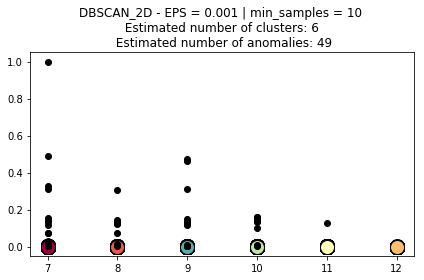

Estimated number of clusters: 6
Estimated number of noise points: 49
Homogeneity: 0.996
Completeness: 0.983
V-measure: 0.990
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.983


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.995


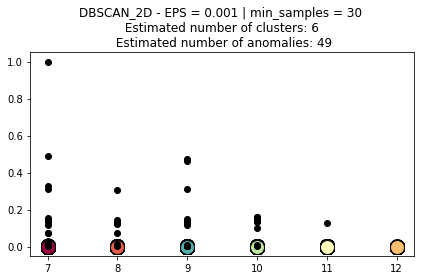

Estimated number of clusters: 6
Estimated number of noise points: 49
Homogeneity: 0.996
Completeness: 0.983
V-measure: 0.990
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.983


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.995


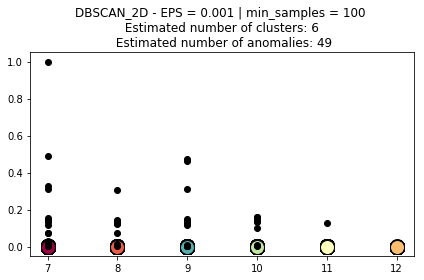

Estimated number of clusters: 6
Estimated number of noise points: 49
Homogeneity: 0.996
Completeness: 0.983
V-measure: 0.990
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.983


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.995


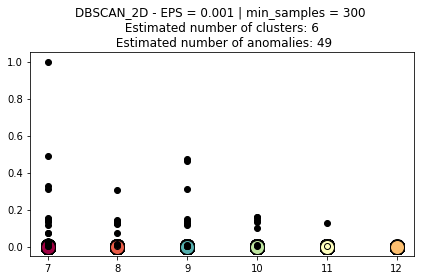

Estimated number of clusters: 6
Estimated number of noise points: 46
Homogeneity: 0.997
Completeness: 0.984
V-measure: 0.990
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.984


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.996


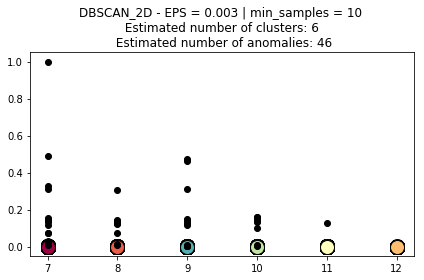

Estimated number of clusters: 6
Estimated number of noise points: 46
Homogeneity: 0.997
Completeness: 0.984
V-measure: 0.990
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.984


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.996


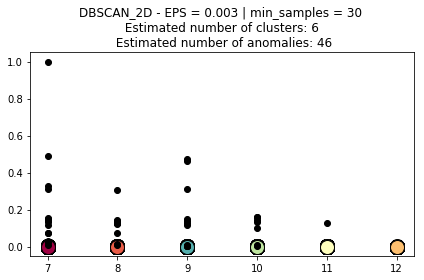

Estimated number of clusters: 6
Estimated number of noise points: 46
Homogeneity: 0.997
Completeness: 0.984
V-measure: 0.990
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.984


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.996


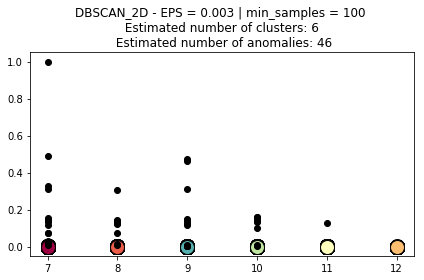

Estimated number of clusters: 6
Estimated number of noise points: 46
Homogeneity: 0.997
Completeness: 0.984
V-measure: 0.990
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.984


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.996


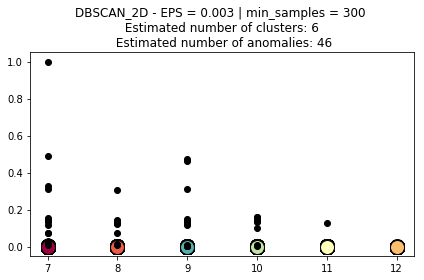

Estimated number of clusters: 6
Estimated number of noise points: 38
Homogeneity: 0.997
Completeness: 0.986
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.986


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.996


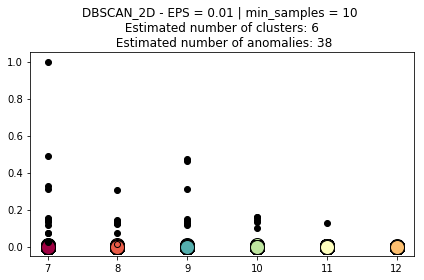

Estimated number of clusters: 6
Estimated number of noise points: 38
Homogeneity: 0.997
Completeness: 0.986
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.986


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.996


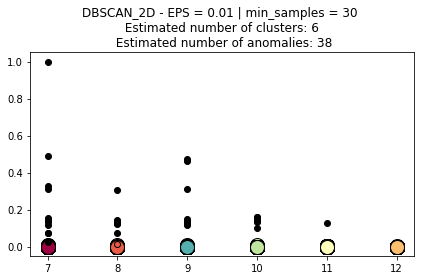

Estimated number of clusters: 6
Estimated number of noise points: 38
Homogeneity: 0.997
Completeness: 0.986
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.986


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.996


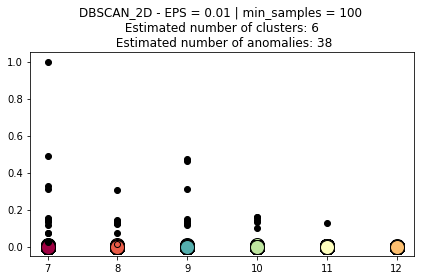

Estimated number of clusters: 6
Estimated number of noise points: 38
Homogeneity: 0.997
Completeness: 0.986
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.986


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.996


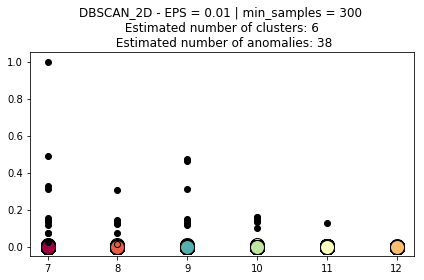

Estimated number of clusters: 6
Estimated number of noise points: 36
Homogeneity: 0.997
Completeness: 0.987
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.987


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.997


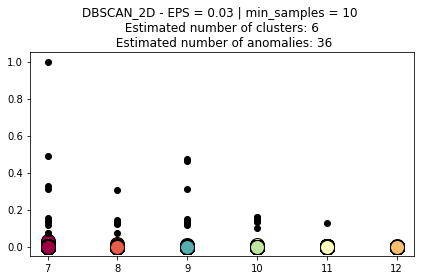

Estimated number of clusters: 6
Estimated number of noise points: 36
Homogeneity: 0.997
Completeness: 0.987
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.987


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.997


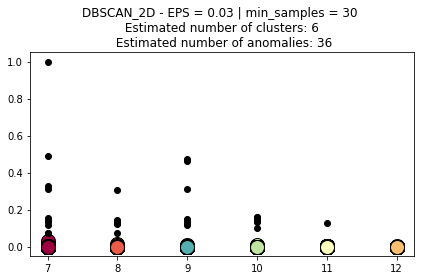

Estimated number of clusters: 6
Estimated number of noise points: 36
Homogeneity: 0.997
Completeness: 0.987
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.987


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.997


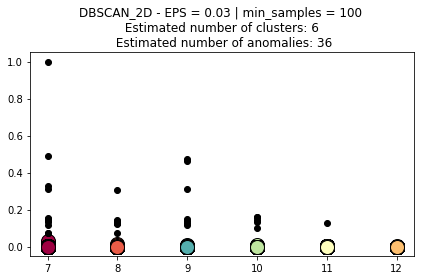

Estimated number of clusters: 6
Estimated number of noise points: 36
Homogeneity: 0.997
Completeness: 0.987
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.987


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.997


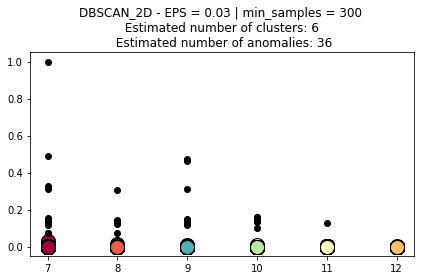

Estimated number of clusters: 6
Estimated number of noise points: 13
Homogeneity: 0.999
Completeness: 0.995
V-measure: 0.997
Adjusted Rand Index: 0.999
Adjusted Mutual Information: 0.995


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.999


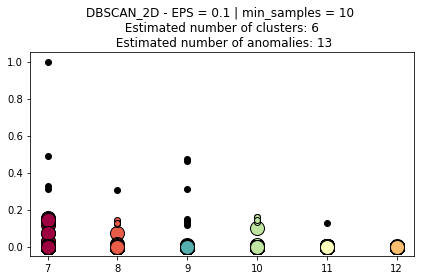

Estimated number of clusters: 6
Estimated number of noise points: 13
Homogeneity: 0.999
Completeness: 0.995
V-measure: 0.997
Adjusted Rand Index: 0.999
Adjusted Mutual Information: 0.995


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.999


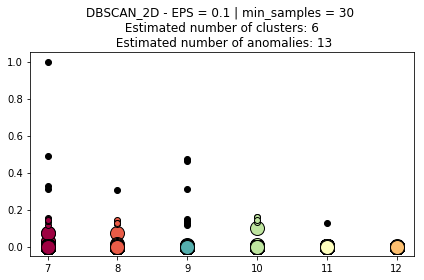

Estimated number of clusters: 6
Estimated number of noise points: 13
Homogeneity: 0.999
Completeness: 0.995
V-measure: 0.997
Adjusted Rand Index: 0.999
Adjusted Mutual Information: 0.995


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.999


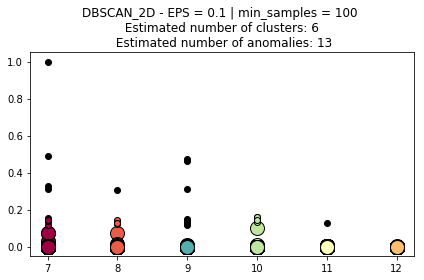

Estimated number of clusters: 6
Estimated number of noise points: 13
Homogeneity: 0.999
Completeness: 0.995
V-measure: 0.997
Adjusted Rand Index: 0.999
Adjusted Mutual Information: 0.995


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.999


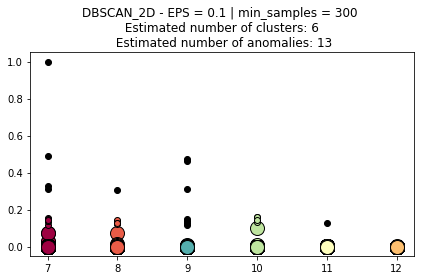

Estimated number of clusters: 6
Estimated number of noise points: 3
Homogeneity: 1.000
Completeness: 0.999
V-measure: 0.999
Adjusted Rand Index: 1.000
Adjusted Mutual Information: 0.999


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.999


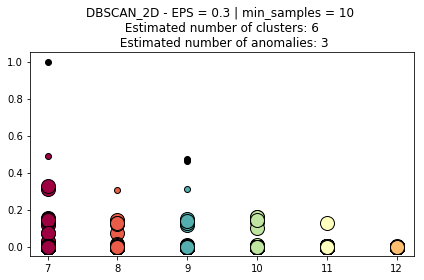

Estimated number of clusters: 6
Estimated number of noise points: 4
Homogeneity: 1.000
Completeness: 0.998
V-measure: 0.999
Adjusted Rand Index: 1.000
Adjusted Mutual Information: 0.998


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.999


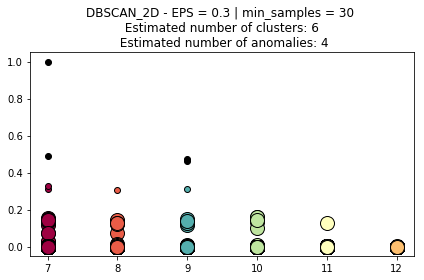

Estimated number of clusters: 6
Estimated number of noise points: 4
Homogeneity: 1.000
Completeness: 0.998
V-measure: 0.999
Adjusted Rand Index: 1.000
Adjusted Mutual Information: 0.998


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.999


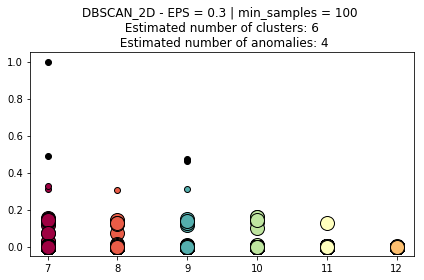

Estimated number of clusters: 6
Estimated number of noise points: 4
Homogeneity: 1.000
Completeness: 0.998
V-measure: 0.999
Adjusted Rand Index: 1.000
Adjusted Mutual Information: 0.998


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.999


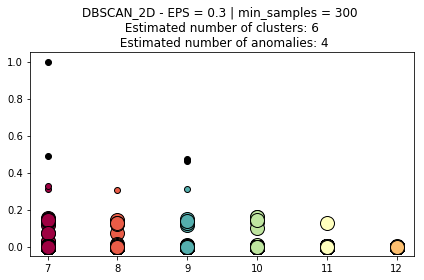

In [66]:
eps_ar = [0.001, 0.003, 0.01, 0.03, 0.1, 0.3]
min_samples_ar = [10, 30, 100, 300]

for n_eps in eps_ar:
    for n_min_samples in min_samples_ar:
        # Run DBSCAN
        db, core_samples_mask, n_clusters_, n_noise_ = perform_dbscan(X, n_eps, n_min_samples)
        
        # Plot and save result
        title = 'DBSCAN_2D - EPS = {} | min_samples = {} \n Estimated number of clusters: {} \n Estimated number of anomalies: {}'.format(n_eps ,n_min_samples, n_clusters_, n_noise_)
        plot_dbscan(X, db.labels_, core_samples_mask, title, n_eps, n_min_samples)

### Final choice

In [67]:
# Final choice for 2D case:
# EPS = 0.03
# min_samples = 30

db, core_samples_mask, n_clusters_, n_noise_ = perform_dbscan(X, 0.03, 30)

Estimated number of clusters: 6
Estimated number of noise points: 36
Homogeneity: 0.997
Completeness: 0.987
V-measure: 0.992
Adjusted Rand Index: 0.997
Adjusted Mutual Information: 0.987


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.997


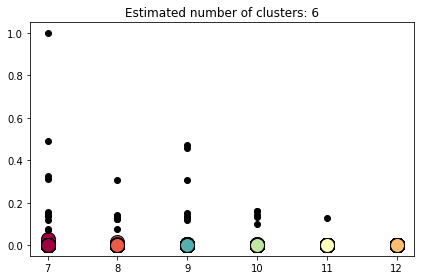

In [69]:
plot_dbscan(X, db.labels_, core_samples_mask, 'Estimated number of clusters: {}'.format(n_clusters_), 0.03, 30)

### Predict clusters on whole dataset

In [70]:
def dbscan_predict(model, X):

    nr_samples = X.shape[0]

    y_new = np.ones(shape=nr_samples, dtype=int) * -1

    for i in range(nr_samples):
        diff = model.components_ - X[i, :]  # NumPy broadcasting

        dist = np.linalg.norm(diff, axis=1)  # Euclidean distance

        shortest_dist_idx = np.argmin(dist)

        if dist[shortest_dist_idx] < model.eps:
            y_new[i] = model.labels_[model.core_sample_indices_[shortest_dist_idx]]

    return y_new

In [71]:
prediction_labels = dbscan_predict(db,Xnew)
prediction_indices = np.where(prediction_labels!=-1)
nr_anomalies_ = sum(prediction_labels==-1)
prediction_mask = np.zeros_like(prediction_labels, dtype=bool)
prediction_mask[prediction_indices] = True

In [72]:
print(nr_anomalies_)

350


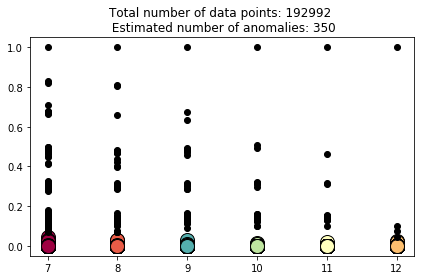

In [73]:
plot_dbscan(Xnew, prediction_labels, prediction_mask, 'Total number of data points: {} \n Estimated number of anomalies: {}'.format(len(prediction_labels), nr_anomalies_), 0.03, 30)

## Check anomalies

### Filter out anomalies based on index

In [74]:
anomaly_indices = np.where(prediction_labels==-1)

In [75]:
X_anom = df2.iloc[anomaly_indices]
X_prev = df2.iloc[X_anom.index.values-2]

In [76]:
X_anom['before_after']=1
X_prev['before_after']=0
df3 = X_anom.append(X_prev).sort_index()
df3.head()

C:\Users\JeffG\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.
C:\Users\JeffG\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


,_id,device,gateways,gpsLat,gpsLon,hdop,rx_time,seqNumber,spfact,day_of_week,time,date,diff,same_spfact,spfact_diff,prev_spfact,before_after
2971,5c18984d4fa20f164de512e2,3432333864377C18,"[{'rssi': -99, 'esp': -100.193314, 'snr': 5, '...",51.235130,4.409110,0.71,2018-12-18 06:48:45.144,10670,8,Tuesday,06:48:45.144000,2018-12-18,36781.0,False,1.0,7.0,1
2974,5c18987d4fa20f164de512f7,3432333852378918,"[{'rssi': -90, 'esp': -90.673981, 'snr': 8, 'g...",51.194122,4.418635,0.65,2018-12-18 06:49:32.711,56807,7,Tuesday,06:49:32.711000,2018-12-18,31.0,True,0.0,8.0,0
3199,5c18a26d4fa20f164de51773,3432333855376418,"[{'rssi': -108, 'esp': -109.764351, 'snr': 3, ...",51.233807,4.409116,0.66,2018-12-18 07:31:56.435,66400,8,Tuesday,07:31:56.435000,2018-12-18,51008.0,False,1.0,7.0,1
3205,5c18a2934fa20f164de51788,3432333853376B18,"[{'rssi': -102, 'esp': -102.924179, 'snr': 6, ...",51.211887,4.398325,0.65,2018-12-18 07:32:35.647,48654,7,Tuesday,07:32:35.647000,2018-12-18,63.0,True,0.0,7.0,0
3332,5c18a5424fa20f164de518ee,3432333855378A18,"[{'rssi': -99, 'esp': -99.212387, 'snr': 13, '...",51.235752,4.409082,0.65,2018-12-18 07:44:02.137,17636,8,Tuesday,07:44:02.137000,2018-12-18,62257.0,False,1.0,7.0,1


In [77]:
print("Number of unique sensors: " + str(len(df3['device'].unique())))

Number of unique sensors: 16


### Plot the anomalies on a map

In [78]:
def color_producer(bef):
    if bef == 0:
        return 'green'
    else:
        return 'red'

In [79]:
def scatter_plot(df):
    mp = folium.Map(location=[51.24, 4.41], 
                    zoom_start=14)

    # Generate legend
    legend_html = '''
         <div style="position: fixed; 
                     bottom: 50px; left: 50px; width: 200px; height: 75px; 
                     border:2px solid grey; z-index:9999; font-size:14px; background-color:white;
                     ">&nbsp; <b> Legend </b> <br>
                     &nbsp; Last received point &nbsp; <i class="fa fa-circle" style="color:green"></i><br>
                     &nbsp; First newly received point &nbsp; <i class="fa fa-circle" style="color:red"></i>
          </div>
         '''
    # Add legend to map
    mp.get_root().html.add_child(folium.Element(legend_html))
    
    # Extract latitude, longitude and spreading factor
    lat = list(df["gpsLat"])
    lon = list(df["gpsLon"])
    device = list(df["device"])
    time = list(df["rx_time"])
    bef = list(df["before_after"])

    fg = folium.FeatureGroup(name="Scatter plot Anomalies")
    
    # Add circles for every data point
    for lt, ln, dev, ti, be in zip(lat, lon, device, time, bef):
        cim = folium.CircleMarker(location=[lt, ln],
                                radius = 6,
                                popup="Device: " +str(dev) + "\n Time:" + str(ti),
                                fill=True, # Set fill to True
                                fill_color=color_producer(be),
                                color = color_producer(be),
                                fill_opacity=0.7)
        fg.add_child(cim)
    
    # Add marker for bpost depot
    folium.Marker([51.237463,4.416658], popup='bpost depot').add_to(mp)
    # Add marker for car repair
    folium.Marker([51.194873, 4.417598], popup='Buga Auto').add_to(mp)

    # Show the map
    mp.add_child(fg)
    
    return mp

In [80]:
scatter_plot(df3)

## 3D case
In this case we look at the relation between the previous SPF, the current SPF and the IPT

In [35]:
# Select features
df_ftrs = df2[['spfact', 'prev_spfact','diff']]
X = df2[['spfact', 'prev_spfact','diff']]
# Normalize interpacket times
#X['diff']=df_ftrs.groupby('spfact').transform(lambda x: (x - x.mean()) / (x.max()-x.min()))
X['diff']=df_ftrs.groupby(['spfact','prev_spfact']).transform(lambda x: (x - x.min()) / (x.max()-x.min()))
# Take 10k samples since more is difficult to calculate the DBSCAN
Xnew = X.values
X = X.sample(20000).values


labels_true = X[:,0]

C:\Users\JeffG\AppData\Roaming\Python\Python36\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


### Define plotting functions

In [37]:
from mpl_toolkits.mplot3d import Axes3D
def plot_dbscan_3D(X, labels, core_samples_mask, title, n_eps=0, n_min_samples=0):
    # Plot result
    fig = plt.figure()
    ax = Axes3D(fig)
    ax.set_zlim(0,1)
    # Black removed and is used for noise instead.
    unique_labels = set(labels)
    colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xy = X[class_member_mask & core_samples_mask]
        ax.scatter(xy[:, 1], xy[:, 0], xy[:, 2], c=col)
        
        xy = X[class_member_mask & ~core_samples_mask]
        ax.scatter(xy[:, 1], xy[:, 0], xy[:, 2], c=col,
                edgecolor='k', s=6)

    ax.set_xlabel('PREVIOUS SPF')
    ax.set_ylabel('CURRENT SPF')
    ax.set_zlabel('Normalized IPT')
    plt.title(title)
    plt.tight_layout()
    #fig.savefig('DBSCAN_3D/DBSCAN_3D_{}_{}.png'.format(n_eps, n_min_samples), dpi=(200), bbox_inches="tight")
    plt.show()

### Run different configurations to find the right parameters

Estimated number of clusters: 29
Estimated number of noise points: 310
Homogeneity: 0.976
Completeness: 0.491
V-measure: 0.653
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.490


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.974


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 26
Estimated number of noise points: 397
Homogeneity: 0.971
Completeness: 0.492
V-measure: 0.653
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.491


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.969


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 17
Estimated number of noise points: 894
Homogeneity: 0.922
Completeness: 0.489
V-measure: 0.639
Adjusted Rand Index: 0.553
Adjusted Mutual Information: 0.488


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.943


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 9
Estimated number of noise points: 2357
Homogeneity: 0.786
Completeness: 0.477
V-measure: 0.594
Adjusted Rand Index: 0.536
Adjusted Mutual Information: 0.477


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.830


C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


Estimated number of clusters: 30
Estimated number of noise points: 283
Homogeneity: 0.978
Completeness: 0.491
V-measure: 0.654
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.490


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.975


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 29
Estimated number of noise points: 294
Homogeneity: 0.978
Completeness: 0.491
V-measure: 0.654
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.490


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.975


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 17
Estimated number of noise points: 889
Homogeneity: 0.923
Completeness: 0.489
V-measure: 0.640
Adjusted Rand Index: 0.553
Adjusted Mutual Information: 0.489


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.943


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 9
Estimated number of noise points: 2352
Homogeneity: 0.787
Completeness: 0.477
V-measure: 0.594
Adjusted Rand Index: 0.536
Adjusted Mutual Information: 0.477


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.831


C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


Estimated number of clusters: 34
Estimated number of noise points: 227
Homogeneity: 0.982
Completeness: 0.490
V-measure: 0.654
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.489


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.980


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 29
Estimated number of noise points: 289
Homogeneity: 0.978
Completeness: 0.491
V-measure: 0.654
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.490


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.976


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 17
Estimated number of noise points: 887
Homogeneity: 0.923
Completeness: 0.490
V-measure: 0.640
Adjusted Rand Index: 0.553
Adjusted Mutual Information: 0.489


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.944


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 9
Estimated number of noise points: 2351
Homogeneity: 0.787
Completeness: 0.477
V-measure: 0.594
Adjusted Rand Index: 0.536
Adjusted Mutual Information: 0.477


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.831


C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


Estimated number of clusters: 35
Estimated number of noise points: 145
Homogeneity: 0.988
Completeness: 0.491
V-measure: 0.656
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.490


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.986


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 29
Estimated number of noise points: 271
Homogeneity: 0.980
Completeness: 0.492
V-measure: 0.655
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.491


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.978


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 17
Estimated number of noise points: 884
Homogeneity: 0.924
Completeness: 0.490
V-measure: 0.640
Adjusted Rand Index: 0.554
Adjusted Mutual Information: 0.489


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.944


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 9
Estimated number of noise points: 2348
Homogeneity: 0.787
Completeness: 0.477
V-measure: 0.594
Adjusted Rand Index: 0.536
Adjusted Mutual Information: 0.477


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.831


C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


Estimated number of clusters: 35
Estimated number of noise points: 69
Homogeneity: 0.994
Completeness: 0.493
V-measure: 0.659
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.492


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.993


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 30
Estimated number of noise points: 185
Homogeneity: 0.985
Completeness: 0.492
V-measure: 0.657
Adjusted Rand Index: 0.556
Adjusted Mutual Information: 0.491


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.985


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 17
Estimated number of noise points: 881
Homogeneity: 0.925
Completeness: 0.490
V-measure: 0.641
Adjusted Rand Index: 0.554
Adjusted Mutual Information: 0.490


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.944


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 9
Estimated number of noise points: 2345
Homogeneity: 0.787
Completeness: 0.478
V-measure: 0.594
Adjusted Rand Index: 0.537
Adjusted Mutual Information: 0.477


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  P

Silhouette Coefficient: 0.831


C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


Estimated number of clusters: 36
Estimated number of noise points: 10
Homogeneity: 0.999
Completeness: 0.496
V-measure: 0.663
Adjusted Rand Index: 0.558
Adjusted Mutual Information: 0.495


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be 

Silhouette Coefficient: 0.997


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 32
Estimated number of noise points: 98
Homogeneity: 0.993
Completeness: 0.495
V-measure: 0.661
Adjusted Rand Index: 0.557
Adjusted Mutual Information: 0.494


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be 

Silhouette Coefficient: 0.992


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 17
Estimated number of noise points: 862
Homogeneity: 0.928
Completeness: 0.492
V-measure: 0.644
Adjusted Rand Index: 0.555
Adjusted Mutual Information: 0.492


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be 

Silhouette Coefficient: 0.947


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

Estimated number of clusters: 9
Estimated number of noise points: 2326
Homogeneity: 0.789
Completeness: 0.479
V-measure: 0.596
Adjusted Rand Index: 0.538
Adjusted Mutual Information: 0.478


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)
C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\pyplot.py:514: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be 

Silhouette Coefficient: 0.833


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
C:\Users\JeffG\Anaconda3\lib\site-packages\matplotlib\figure.py:2366: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


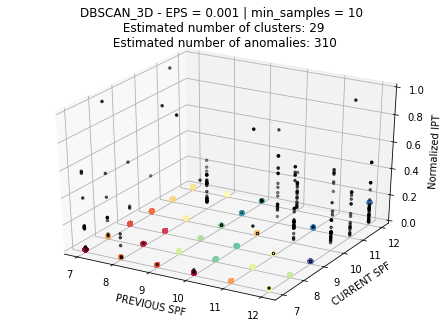

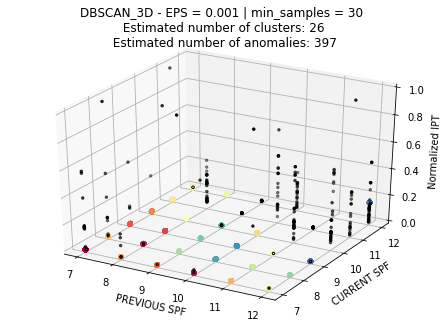

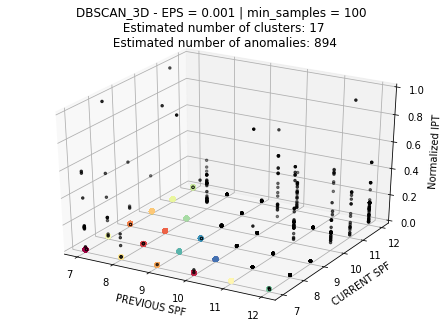

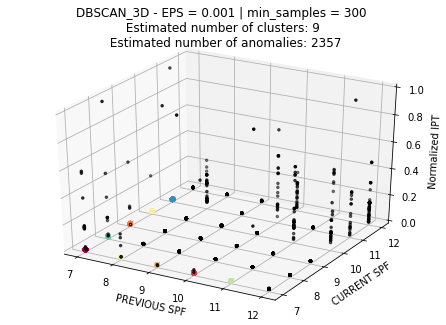

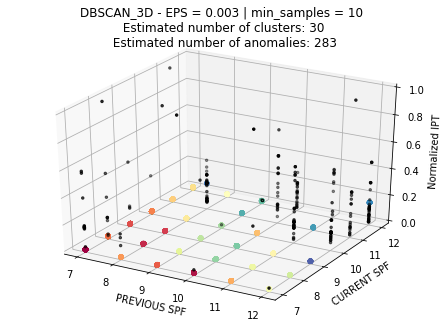

...

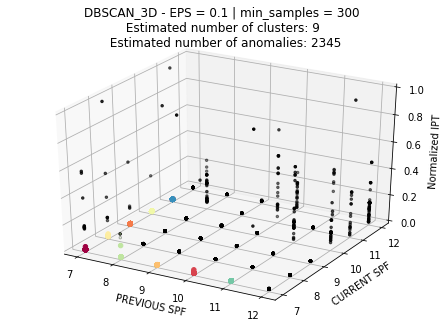

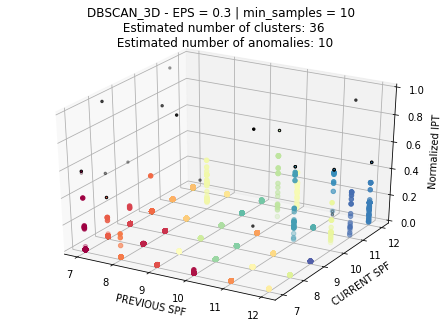

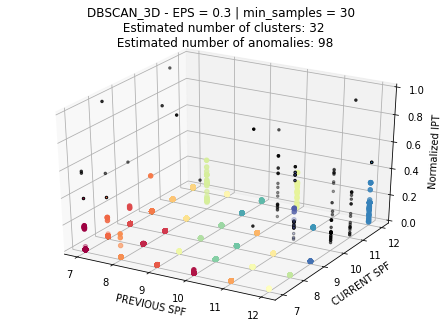

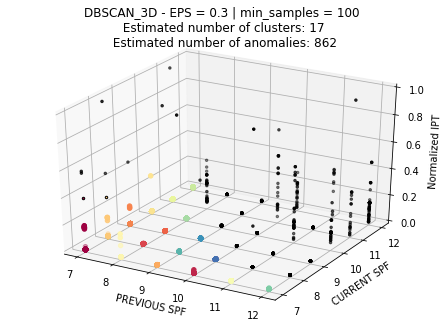

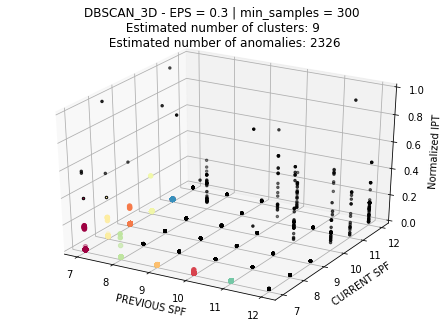

In [34]:
eps_ar = [0.001, 0.003, 0.01, 0.03, 0.1, 0.3]
min_samples_ar = [10, 30, 100, 300]

for n_eps in eps_ar:
    for n_min_samples in min_samples_ar:
        # Run DBSCAN
        db, core_samples_mask, n_clusters_, n_noise_ = perform_dbscan(X, n_eps, n_min_samples)
        
        # Plot and save result
        title = 'DBSCAN_3D - EPS = {} | min_samples = {} \n Estimated number of clusters: {} \n Estimated number of anomalies: {}'.format(n_eps ,n_min_samples, n_clusters_, n_noise_)
        plot_dbscan_3D(X, db.labels_, core_samples_mask, title, n_eps, n_min_samples)

### Final choice

In [38]:
# Final choice for 2D case:
# EPS = 0.03
# min_samples = 30

db, core_samples_mask, n_clusters_, n_noise_ = perform_dbscan(X, 0.1, 30)

Estimated number of clusters: 30
Estimated number of noise points: 180
Homogeneity: 0.986
Completeness: 0.497
V-measure: 0.661
Adjusted Rand Index: 0.562
Adjusted Mutual Information: 0.496


C:\Users\JeffG\Anaconda3\lib\site-packages\sklearn\metrics\cluster\supervised.py:732: FutureWarning: The behavior of AMI will change in version 0.22. To match the behavior of 'v_measure_score', AMI will use average_method='arithmetic' by default.
  FutureWarning)


Silhouette Coefficient: 0.986


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

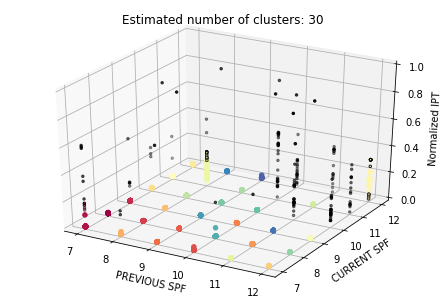

In [39]:
plot_dbscan_3D(X, db.labels_, core_samples_mask, 'Estimated number of clusters: {}'.format(n_clusters_))

### Predict clusters on whole dataset

In [ ]:
def dbscan_predict(model, X):

    nr_samples = X.shape[0]

    y_new = np.ones(shape=nr_samples, dtype=int) * -1

    for i in range(nr_samples):
        diff = model.components_ - X[i, :]  # NumPy broadcasting

        dist = np.linalg.norm(diff, axis=1)  # Euclidean distance

        shortest_dist_idx = np.argmin(dist)

        if dist[shortest_dist_idx] < model.eps:
            y_new[i] = model.labels_[model.core_sample_indices_[shortest_dist_idx]]

    return y_new

In [42]:
prediction_labels = dbscan_predict(db,Xnew)
prediction_indices = np.where(prediction_labels!=-1)
nr_anomalies_ = sum(prediction_labels==-1)
prediction_mask = np.zeros_like(prediction_labels, dtype=bool)
prediction_mask[prediction_indices] = True

In [43]:
print(nr_anomalies_)

1795


'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with 'x' & 'y'.  Please use a 2-D array with a single row if you really want to specify the same RGB or RGBA value for all points.
'c' argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches

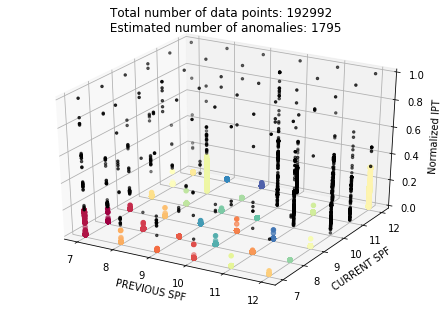

In [44]:
plot_dbscan_3D(Xnew, prediction_labels, prediction_mask, 'Total number of data points: {} \n Estimated number of anomalies: {}'.format(len(prediction_labels), nr_anomalies_))

## Check normal data

In [ ]:
prediction_indices = np.where(prediction_labels!=-1)
prediction_indices

In [ ]:
Xframe = pd.DataFrame(Xnew)
Xframe.columns = ['spfact','diff_norm']

In [ ]:
Xframe['cluster'] = prediction_labels

In [ ]:
Xframe.head()

In [ ]:
Xframe_normal = Xframe[Xframe['cluster']!=-1]
Xframe_normal.groupby('spfact')['diff_norm'].describe()

In [ ]:
df_ftrs.groupby('spfact').describe(percentiles=[0.5, 0.75 ,0.95, 0.99, 0.995, 0.999])

In [ ]:
stats = df2.groupby('spfact')['diff'].describe(percentiles=[0.5, 0.75 ,0.95, 0.99, 0.995, 0.999])
stats